<a href="https://colab.research.google.com/github/savindu29/NeuralNet/blob/main/preprocess_new.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Set library versions

In [1]:
!pip uninstall numpy -y


Found existing installation: numpy 1.26.0
Uninstalling numpy-1.26.0:
  Successfully uninstalled numpy-1.26.0


In [2]:
!pip install numpy==1.26

  Using cached numpy-1.26.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (58 kB)
Using cached numpy-1.26.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.2 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pyriemann 0.8 requires numpy>=2.0.0, but you have numpy 1.26.0 which is incompatible.


In [3]:
import numpy as np
print(np.__version__)

1.26.0


# Install Libraries

In [4]:
!pip install mne
!pip install torch-summary

In [5]:
import os
import mne
import math
import copy
import gdown
import random
import scipy.io
import numpy as np
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt
from mne.preprocessing import ICA
from mne.decoding import CSP
from pyriemann.estimation import Covariances
from pyriemann.tangentspace import TangentSpace

# Torch
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchsummary import summary
from torch.autograd import Variable
from torch.utils.data import DataLoader, TensorDataset, random_split

# Scikit-Learn
from sklearn.feature_selection import mutual_info_classif
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Downloading the dataset (BCI Competition IV 2a)



In [6]:
# Download dataset if needed
if not os.path.exists('/content/BCICIV_2a_gdf.zip'):
    !wget https://www.bbci.de/competition/download/competition_iv/BCICIV_2a_gdf.zip


--2025-04-02 22:33:56--  https://www.bbci.de/competition/download/competition_iv/BCICIV_2a_gdf.zip
Resolving www.bbci.de (www.bbci.de)... 130.149.80.149
Connecting to www.bbci.de (www.bbci.de)|130.149.80.149|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 439968864 (420M) [application/zip]
Saving to: ‘BCICIV_2a_gdf.zip’

BCICIV_2a_gdf.zip   100%[===================>] 419.59M  22.1MB/s    in 20s     

2025-04-02 22:34:17 (20.6 MB/s) - ‘BCICIV_2a_gdf.zip’ saved [439968864/439968864]



In [7]:
# Unzip data if needed
if not os.path.exists('/content/raw_data'):
    !mkdir -p /content/raw_data/
    !unzip /content/BCICIV_2a_gdf.zip -d raw_data

Archive:  /content/BCICIV_2a_gdf.zip
  inflating: raw_data/A01E.gdf       
  inflating: raw_data/A01T.gdf       
  inflating: raw_data/A02E.gdf       
  inflating: raw_data/A02T.gdf       
  inflating: raw_data/A03E.gdf       
  inflating: raw_data/A03T.gdf       
  inflating: raw_data/A04E.gdf       
  inflating: raw_data/A04T.gdf       
  inflating: raw_data/A05E.gdf       
  inflating: raw_data/A05T.gdf       
  inflating: raw_data/A06E.gdf       
  inflating: raw_data/A06T.gdf       
  inflating: raw_data/A07E.gdf       
  inflating: raw_data/A07T.gdf       
  inflating: raw_data/A08E.gdf       
  inflating: raw_data/A08T.gdf       
  inflating: raw_data/A09E.gdf       
  inflating: raw_data/A09T.gdf       


# Download true labels

In [8]:
# Download true labels if needed
if not os.path.exists('/content/true_labels.zip'):
    # Shareable link
    shareable_link = 'https://drive.google.com/file/d/1LizqO0zGP1Cs9tSgYfQaao6Yngr16-zK/view?usp=drive_link'
    # Extract file ID from the shareable link
    file_id = shareable_link.split('/d/')[1].split('/view')[0]
    # Create the direct download link
    download_url = f'https://drive.google.com/uc?id={file_id}&export=download'
    # Specify the output file path
    output_file = 'true_labels.zip'
    # Download the file
    gdown.download(download_url, output_file, quiet=False)

    # Unzip true labels
    !mkdir -p /content/second_session_labels
    !unzip /content/true_labels.zip -d second_session_labels

Downloading...
From: https://drive.google.com/uc?id=1LizqO0zGP1Cs9tSgYfQaao6Yngr16-zK&export=download
To: /content/true_labels.zip
100%|██████████| 7.20k/7.20k [00:00<00:00, 15.2MB/s]


Archive:  /content/true_labels.zip
  inflating: second_session_labels/A09E.mat  
  inflating: second_session_labels/A05T.mat  
  inflating: second_session_labels/A06E.mat  
  inflating: second_session_labels/A05E.mat  
  inflating: second_session_labels/A04T.mat  
  inflating: second_session_labels/A02E.mat  
  inflating: second_session_labels/A08E.mat  
  inflating: second_session_labels/A01T.mat  
  inflating: second_session_labels/A04E.mat  
  inflating: second_session_labels/A03T.mat  
  inflating: second_session_labels/A02T.mat  
  inflating: second_session_labels/A06T.mat  
  inflating: second_session_labels/A09T.mat  
  inflating: second_session_labels/A07E.mat  
  inflating: second_session_labels/A01E.mat  
  inflating: second_session_labels/A07T.mat  
  inflating: second_session_labels/A08T.mat  
  inflating: second_session_labels/A03E.mat  


# Define folder paths

In [9]:
# Create directories
!mkdir -p /content/cleaned_data/
!mkdir -p /content/cleaned_data/first_session
!mkdir -p /content/cleaned_data/second_session

# MNE matching channel names

In [10]:
rename_dict = {
    "EEG-Fz": "Fz",
    "EEG-0": "Fp1",
    "EEG-1": "Fp2",
    "EEG-2": "F7",
    "EEG-3": "F3",
    "EEG-4": "F4",
    "EEG-5": "F8",
    "EEG-C3": "C3",
    "EEG-6": "T7",
    "EEG-Cz": "Cz",
    "EEG-7": "T8",
    "EEG-C4": "C4",
    "EEG-8": "P7",
    "EEG-9": "P3",
    "EEG-10": "P4",
    "EEG-11": "P8",
    "EEG-12": "O1",
    "EEG-13": "Oz",
    "EEG-14": "O2",
    "EEG-Pz": "Pz",
    "EEG-15": "FC1",
    "EEG-16": "FC2"
}

# EOG channels

In [11]:
eog_channels= ['EOG-left', 'EOG-central', 'EOG-right']

# First Session Data Preprocess

In [12]:
raw_data_folder = '/content/raw_data/'
cleaned_data_folder = '/content/cleaned_data/first_session/'
files = os.listdir(raw_data_folder)

Extracting EDF parameters from /content/raw_data/A06T.gdf...
GDF file detected
Setting channel info structure...
Could not determine channel type of the following channels, they will be set as EEG:
EEG-Fz, EEG, EEG, EEG, EEG, EEG, EEG, EEG-C3, EEG, EEG-Cz, EEG, EEG-C4, EEG, EEG, EEG, EEG, EEG, EEG, EEG, EEG-Pz, EEG, EEG
Creating raw.info structure...


/usr/lib/python3.11/contextlib.py:144: RuntimeWarning: Channel names are not unique, found duplicates for: {'EEG'}. Applying running numbers for duplicates.
  next(self.gen)


Reading 0 ... 678979  =      0.000 ...  2715.916 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 40 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.00
- Lower transition bandwidth: 2.00 Hz (-12 dB cutoff frequency: 3.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-12 dB cutoff frequency: 45.00 Hz)
- Filter length: 413 samples (1.652 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 48 - 52 Hz



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 48.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 48.25 Hz)
- Upper passband edge: 51.50 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 51.75 Hz)
- Filter length: 1651 samples (6.604 s)

Fitting ICA to data using 22 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


Selecting by number: 22 components
Fitting ICA took 44.9s.
Applying ICA to Raw instance
    Transforming to ICA space (22 components)
    Zeroing out 2 ICA components
    Projecting back using 22 PCA components
Using matplotlib as 2D backend.


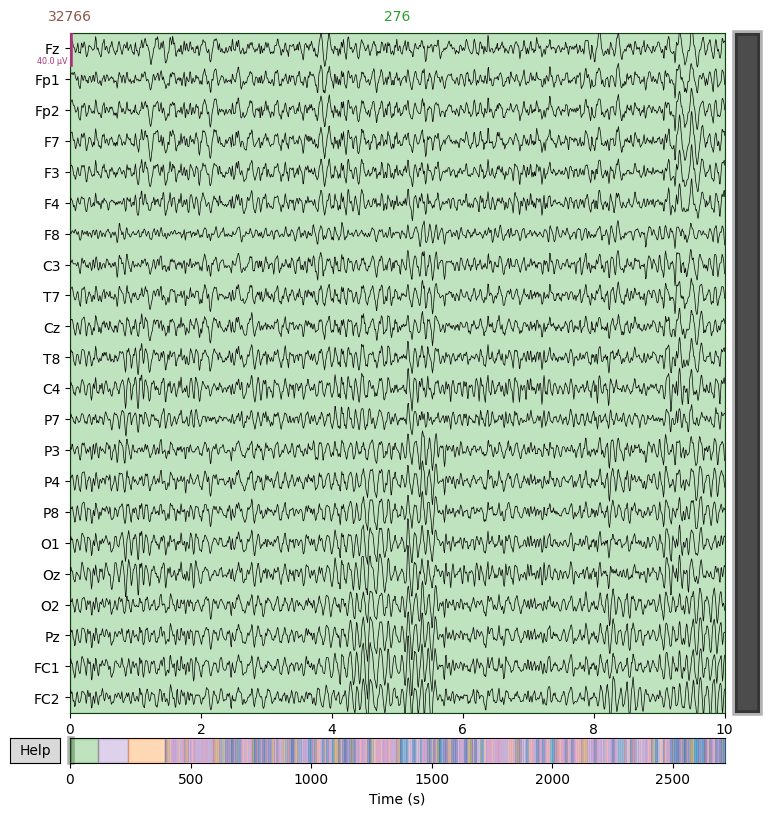

Writing /content/cleaned_data/first_session/A06T.fif


<ipython-input-13-8ce6c1eaf24e>:60: RuntimeWarning: This filename (/content/cleaned_data/first_session/A06T.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  cleaned_raw.save(new_file_path, overwrite=True)


Closing /content/cleaned_data/first_session/A06T.fif
[done]
Extracting EDF parameters from /content/raw_data/A02T.gdf...
GDF file detected
Setting channel info structure...
Could not determine channel type of the following channels, they will be set as EEG:
EEG-Fz, EEG, EEG, EEG, EEG, EEG, EEG, EEG-C3, EEG, EEG-Cz, EEG, EEG-C4, EEG, EEG, EEG, EEG, EEG, EEG, EEG, EEG-Pz, EEG, EEG
Creating raw.info structure...
Reading 0 ... 677168  =      0.000 ...  2708.672 secs...


/usr/lib/python3.11/contextlib.py:144: RuntimeWarning: Channel names are not unique, found duplicates for: {'EEG'}. Applying running numbers for duplicates.
  next(self.gen)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 40 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.00
- Lower transition bandwidth: 2.00 Hz (-12 dB cutoff frequency: 3.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-12 dB cutoff frequency: 45.00 Hz)
- Filter length: 413 samples (1.652 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 48 - 52 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 48.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 48.25 Hz)

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.3s


Fitting ICA to data using 22 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.4s


Selecting by number: 22 components
Fitting ICA took 33.7s.
Applying ICA to Raw instance
    Transforming to ICA space (22 components)
    Zeroing out 2 ICA components
    Projecting back using 22 PCA components


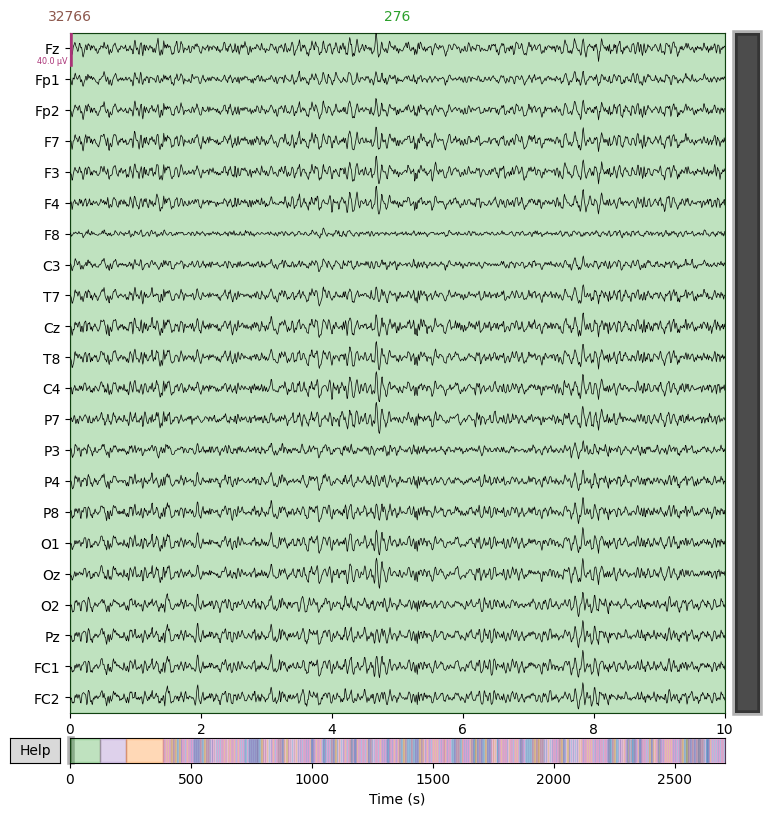

Writing /content/cleaned_data/first_session/A02T.fif


<ipython-input-13-8ce6c1eaf24e>:60: RuntimeWarning: This filename (/content/cleaned_data/first_session/A02T.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  cleaned_raw.save(new_file_path, overwrite=True)


Closing /content/cleaned_data/first_session/A02T.fif
[done]
Extracting EDF parameters from /content/raw_data/A04T.gdf...
GDF file detected
Setting channel info structure...
Could not determine channel type of the following channels, they will be set as EEG:
EEG-Fz, EEG, EEG, EEG, EEG, EEG, EEG, EEG-C3, EEG, EEG-Cz, EEG, EEG-C4, EEG, EEG, EEG, EEG, EEG, EEG, EEG, EEG-Pz, EEG, EEG
Creating raw.info structure...
Reading 0 ... 600914  =      0.000 ...  2403.656 secs...


/usr/lib/python3.11/contextlib.py:144: RuntimeWarning: Channel names are not unique, found duplicates for: {'EEG'}. Applying running numbers for duplicates.
  next(self.gen)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 40 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.00
- Lower transition bandwidth: 2.00 Hz (-12 dB cutoff frequency: 3.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-12 dB cutoff frequency: 45.00 Hz)
- Filter length: 413 samples (1.652 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 48 - 52 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 48.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 48.25 Hz)

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.4s


Fitting ICA to data using 22 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.4s


Selecting by number: 22 components
Fitting ICA took 33.0s.
Applying ICA to Raw instance
    Transforming to ICA space (22 components)
    Zeroing out 2 ICA components
    Projecting back using 22 PCA components


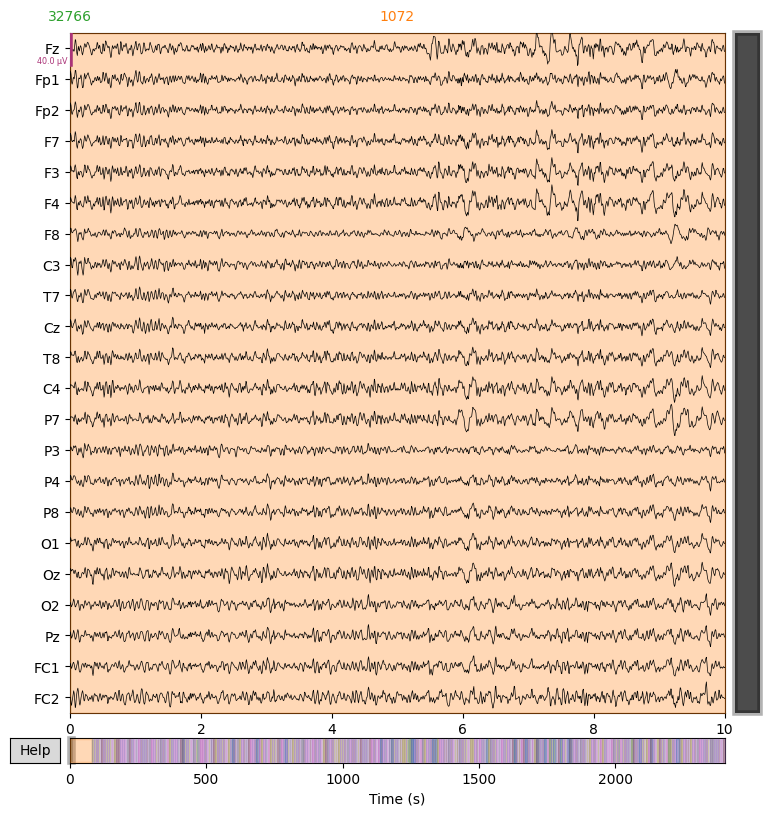

Writing /content/cleaned_data/first_session/A04T.fif


<ipython-input-13-8ce6c1eaf24e>:60: RuntimeWarning: This filename (/content/cleaned_data/first_session/A04T.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  cleaned_raw.save(new_file_path, overwrite=True)


Closing /content/cleaned_data/first_session/A04T.fif
[done]
Extracting EDF parameters from /content/raw_data/A07T.gdf...
GDF file detected
Setting channel info structure...
Could not determine channel type of the following channels, they will be set as EEG:
EEG-Fz, EEG, EEG, EEG, EEG, EEG, EEG, EEG-C3, EEG, EEG-Cz, EEG, EEG-C4, EEG, EEG, EEG, EEG, EEG, EEG, EEG, EEG-Pz, EEG, EEG
Creating raw.info structure...
Reading 0 ... 681070  =      0.000 ...  2724.280 secs...


/usr/lib/python3.11/contextlib.py:144: RuntimeWarning: Channel names are not unique, found duplicates for: {'EEG'}. Applying running numbers for duplicates.
  next(self.gen)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 40 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.00
- Lower transition bandwidth: 2.00 Hz (-12 dB cutoff frequency: 3.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-12 dB cutoff frequency: 45.00 Hz)
- Filter length: 413 samples (1.652 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 48 - 52 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 48.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 48.25 Hz)

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.4s


Fitting ICA to data using 22 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


Selecting by number: 22 components
Fitting ICA took 35.2s.
Applying ICA to Raw instance
    Transforming to ICA space (22 components)
    Zeroing out 2 ICA components
    Projecting back using 22 PCA components


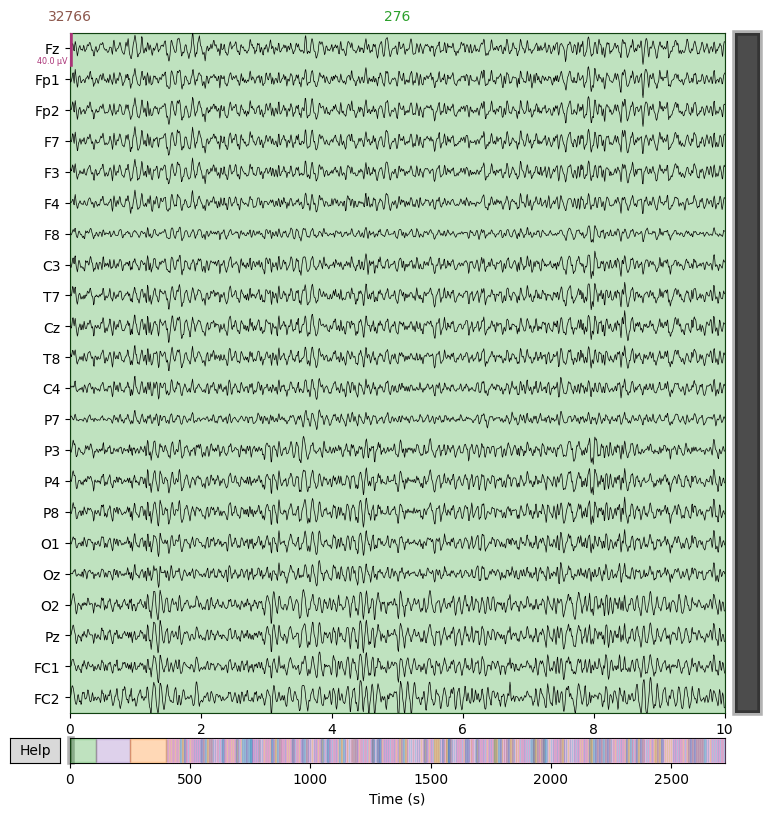

Writing /content/cleaned_data/first_session/A07T.fif


<ipython-input-13-8ce6c1eaf24e>:60: RuntimeWarning: This filename (/content/cleaned_data/first_session/A07T.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  cleaned_raw.save(new_file_path, overwrite=True)


Closing /content/cleaned_data/first_session/A07T.fif
[done]
Extracting EDF parameters from /content/raw_data/A09T.gdf...
GDF file detected
Setting channel info structure...
Could not determine channel type of the following channels, they will be set as EEG:
EEG-Fz, EEG, EEG, EEG, EEG, EEG, EEG, EEG-C3, EEG, EEG-Cz, EEG, EEG-C4, EEG, EEG, EEG, EEG, EEG, EEG, EEG, EEG-Pz, EEG, EEG
Creating raw.info structure...
Reading 0 ... 673327  =      0.000 ...  2693.308 secs...


/usr/lib/python3.11/contextlib.py:144: RuntimeWarning: Channel names are not unique, found duplicates for: {'EEG'}. Applying running numbers for duplicates.
  next(self.gen)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 40 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.00
- Lower transition bandwidth: 2.00 Hz (-12 dB cutoff frequency: 3.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-12 dB cutoff frequency: 45.00 Hz)
- Filter length: 413 samples (1.652 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 48 - 52 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 48.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 48.25 Hz)

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


Fitting ICA to data using 22 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


Selecting by number: 22 components
Fitting ICA took 31.1s.
Applying ICA to Raw instance
    Transforming to ICA space (22 components)
    Zeroing out 2 ICA components
    Projecting back using 22 PCA components


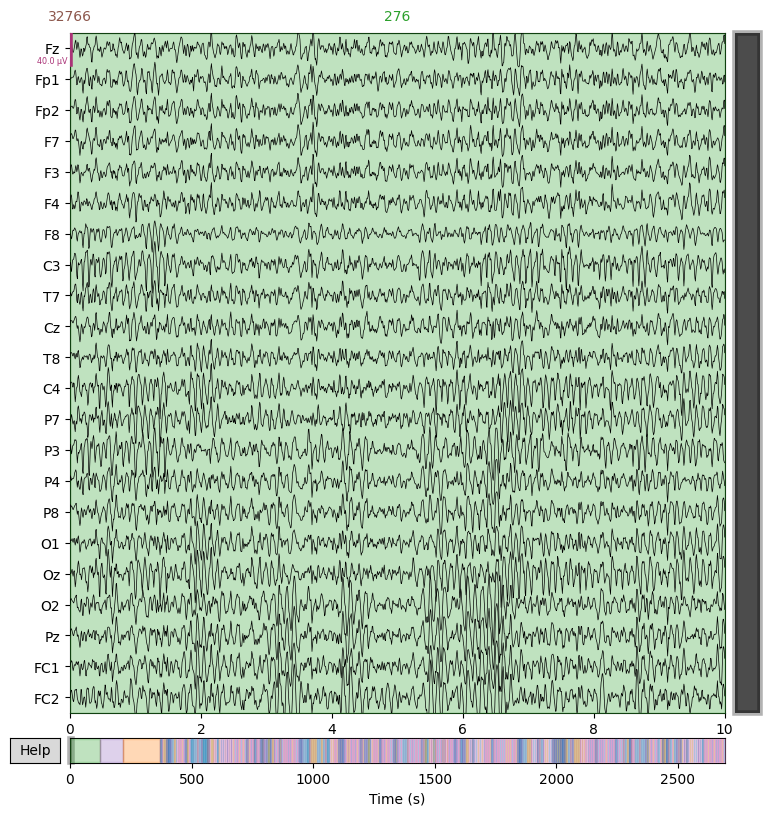

Writing /content/cleaned_data/first_session/A09T.fif


<ipython-input-13-8ce6c1eaf24e>:60: RuntimeWarning: This filename (/content/cleaned_data/first_session/A09T.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  cleaned_raw.save(new_file_path, overwrite=True)


Closing /content/cleaned_data/first_session/A09T.fif
[done]
Extracting EDF parameters from /content/raw_data/A03T.gdf...
GDF file detected
Setting channel info structure...
Could not determine channel type of the following channels, they will be set as EEG:
EEG-Fz, EEG, EEG, EEG, EEG, EEG, EEG, EEG-C3, EEG, EEG-Cz, EEG, EEG-C4, EEG, EEG, EEG, EEG, EEG, EEG, EEG, EEG-Pz, EEG, EEG
Creating raw.info structure...
Reading 0 ... 660529  =      0.000 ...  2642.116 secs...


/usr/lib/python3.11/contextlib.py:144: RuntimeWarning: Channel names are not unique, found duplicates for: {'EEG'}. Applying running numbers for duplicates.
  next(self.gen)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 40 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.00
- Lower transition bandwidth: 2.00 Hz (-12 dB cutoff frequency: 3.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-12 dB cutoff frequency: 45.00 Hz)
- Filter length: 413 samples (1.652 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 48 - 52 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 48.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 48.25 Hz)

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


Fitting ICA to data using 22 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


Selecting by number: 22 components
Fitting ICA took 51.8s.
Applying ICA to Raw instance
    Transforming to ICA space (22 components)
    Zeroing out 2 ICA components
    Projecting back using 22 PCA components


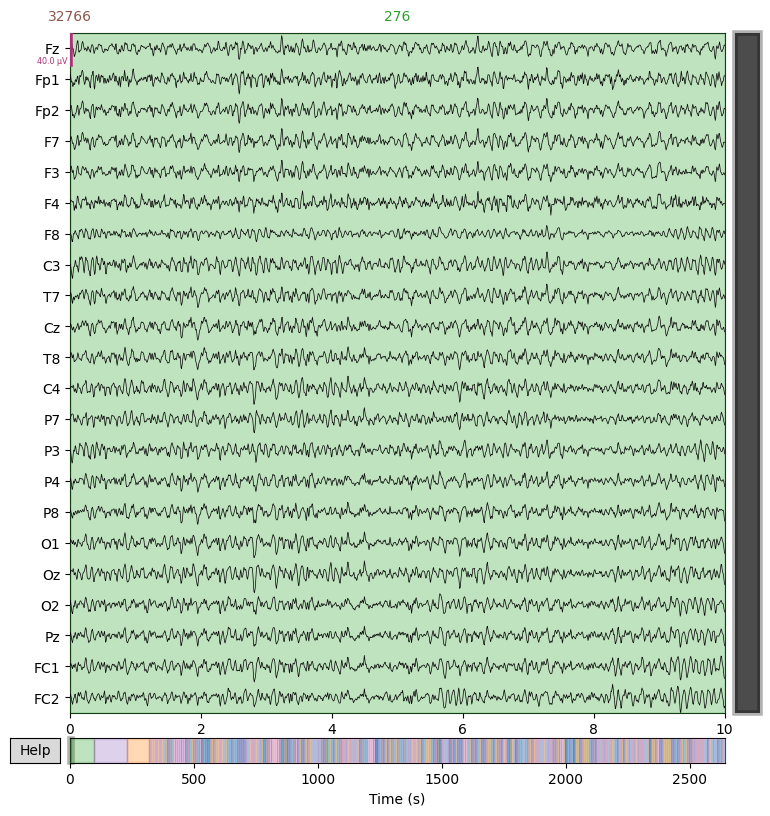

Writing /content/cleaned_data/first_session/A03T.fif


<ipython-input-13-8ce6c1eaf24e>:60: RuntimeWarning: This filename (/content/cleaned_data/first_session/A03T.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  cleaned_raw.save(new_file_path, overwrite=True)


Closing /content/cleaned_data/first_session/A03T.fif
[done]
Extracting EDF parameters from /content/raw_data/A05T.gdf...
GDF file detected
Setting channel info structure...
Could not determine channel type of the following channels, they will be set as EEG:
EEG-Fz, EEG, EEG, EEG, EEG, EEG, EEG, EEG-C3, EEG, EEG-Cz, EEG, EEG-C4, EEG, EEG, EEG, EEG, EEG, EEG, EEG, EEG-Pz, EEG, EEG
Creating raw.info structure...
Reading 0 ... 686119  =      0.000 ...  2744.476 secs...


/usr/lib/python3.11/contextlib.py:144: RuntimeWarning: Channel names are not unique, found duplicates for: {'EEG'}. Applying running numbers for duplicates.
  next(self.gen)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 40 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.00
- Lower transition bandwidth: 2.00 Hz (-12 dB cutoff frequency: 3.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-12 dB cutoff frequency: 45.00 Hz)
- Filter length: 413 samples (1.652 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 48 - 52 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 48.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 48.25 Hz)

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


Fitting ICA to data using 22 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


Selecting by number: 22 components
Fitting ICA took 50.6s.
Applying ICA to Raw instance
    Transforming to ICA space (22 components)
    Zeroing out 2 ICA components
    Projecting back using 22 PCA components


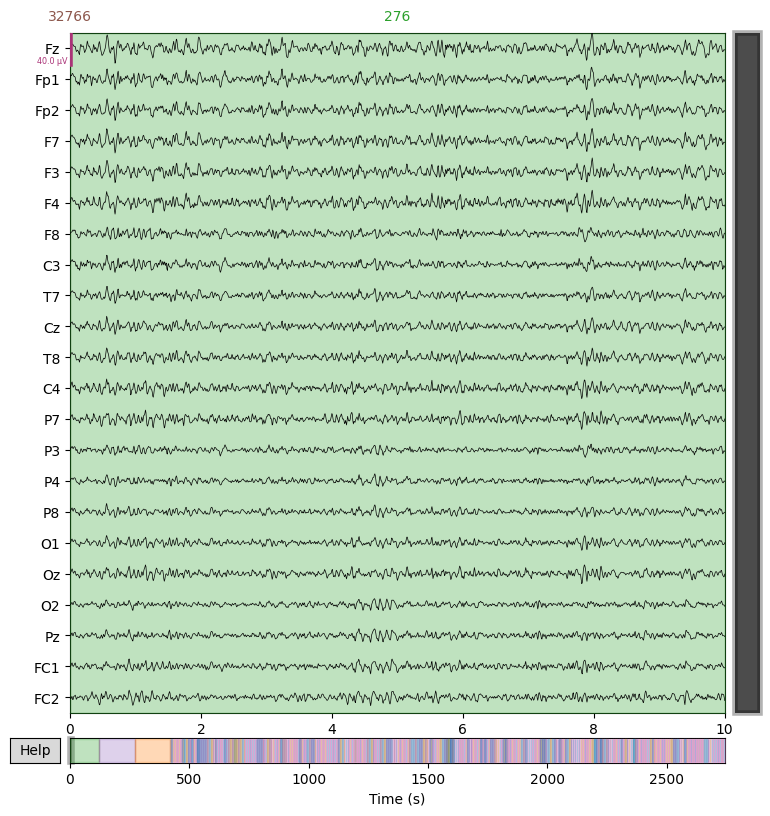

Writing /content/cleaned_data/first_session/A05T.fif


<ipython-input-13-8ce6c1eaf24e>:60: RuntimeWarning: This filename (/content/cleaned_data/first_session/A05T.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  cleaned_raw.save(new_file_path, overwrite=True)


Closing /content/cleaned_data/first_session/A05T.fif
[done]
Extracting EDF parameters from /content/raw_data/A01T.gdf...
GDF file detected
Setting channel info structure...
Could not determine channel type of the following channels, they will be set as EEG:
EEG-Fz, EEG, EEG, EEG, EEG, EEG, EEG, EEG-C3, EEG, EEG-Cz, EEG, EEG-C4, EEG, EEG, EEG, EEG, EEG, EEG, EEG, EEG-Pz, EEG, EEG
Creating raw.info structure...
Reading 0 ... 672527  =      0.000 ...  2690.108 secs...


/usr/lib/python3.11/contextlib.py:144: RuntimeWarning: Channel names are not unique, found duplicates for: {'EEG'}. Applying running numbers for duplicates.
  next(self.gen)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 40 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.00
- Lower transition bandwidth: 2.00 Hz (-12 dB cutoff frequency: 3.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-12 dB cutoff frequency: 45.00 Hz)
- Filter length: 413 samples (1.652 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 48 - 52 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 48.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 48.25 Hz)

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


Fitting ICA to data using 22 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


Selecting by number: 22 components
Fitting ICA took 32.1s.
Applying ICA to Raw instance
    Transforming to ICA space (22 components)
    Zeroing out 2 ICA components
    Projecting back using 22 PCA components


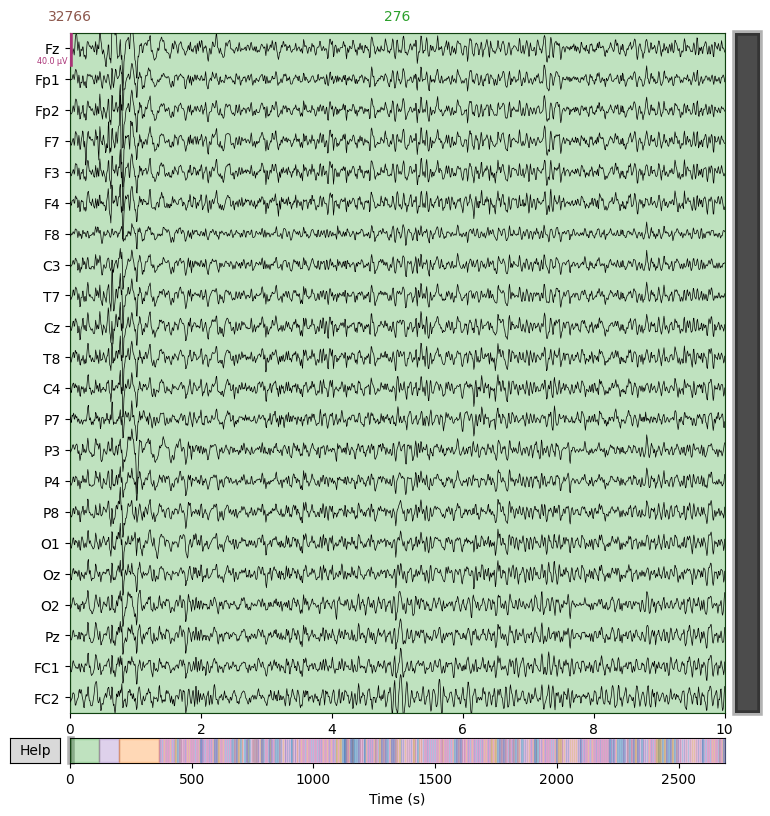

Writing /content/cleaned_data/first_session/A01T.fif


<ipython-input-13-8ce6c1eaf24e>:60: RuntimeWarning: This filename (/content/cleaned_data/first_session/A01T.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  cleaned_raw.save(new_file_path, overwrite=True)


Closing /content/cleaned_data/first_session/A01T.fif
[done]
Extracting EDF parameters from /content/raw_data/A08T.gdf...
GDF file detected
Setting channel info structure...
Could not determine channel type of the following channels, they will be set as EEG:
EEG-Fz, EEG, EEG, EEG, EEG, EEG, EEG, EEG-C3, EEG, EEG-Cz, EEG, EEG-C4, EEG, EEG, EEG, EEG, EEG, EEG, EEG, EEG-Pz, EEG, EEG
Creating raw.info structure...
Reading 0 ... 675269  =      0.000 ...  2701.076 secs...


/usr/lib/python3.11/contextlib.py:144: RuntimeWarning: Channel names are not unique, found duplicates for: {'EEG'}. Applying running numbers for duplicates.
  next(self.gen)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 40 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.00
- Lower transition bandwidth: 2.00 Hz (-12 dB cutoff frequency: 3.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-12 dB cutoff frequency: 45.00 Hz)
- Filter length: 413 samples (1.652 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 48 - 52 Hz


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s



FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 48.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 48.25 Hz)
- Upper passband edge: 51.50 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 51.75 Hz)
- Filter length: 1651 samples (6.604 s)

Fitting ICA to data using 22 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


Selecting by number: 22 components
Fitting ICA took 38.0s.
Applying ICA to Raw instance
    Transforming to ICA space (22 components)
    Zeroing out 2 ICA components
    Projecting back using 22 PCA components


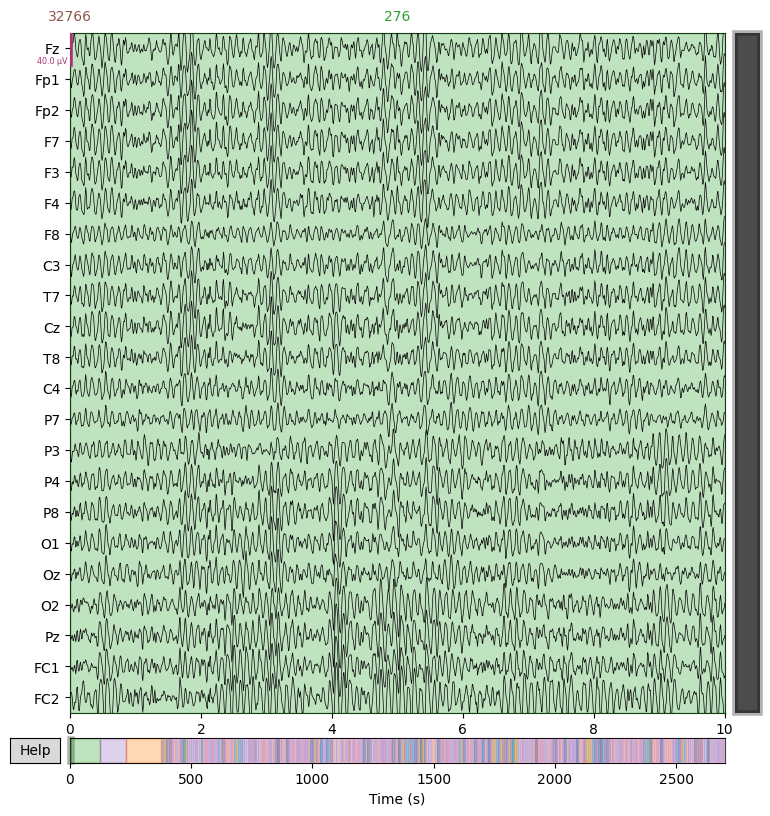

Writing /content/cleaned_data/first_session/A08T.fif


<ipython-input-13-8ce6c1eaf24e>:60: RuntimeWarning: This filename (/content/cleaned_data/first_session/A08T.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  cleaned_raw.save(new_file_path, overwrite=True)


Closing /content/cleaned_data/first_session/A08T.fif
[done]


In [13]:
# Selecting files with suffix 'T.gdf'
filtered_files = [file for file in files if file.endswith('T.gdf')]

raw_list = []
highpass=4
lowpass=40
line_freq=50
ica_components=15
# Iterating through filtered files
for file in filtered_files:
    file_path = os.path.join(raw_data_folder, file)

    # Reading raw data
    eog_channels= ['EOG-left', 'EOG-central', 'EOG-right']  # Mark the EOG channels as bad

    raw = mne.io.read_raw_gdf(file_path, eog=eog_channels, preload=True)
    # Rename the channels based on rename_dict using MNE's rename_channels method
    raw.rename_channels(rename_dict)
    # Droping EOG channels
    raw.drop_channels(eog_channels)

    # Apply band-pass filter (mu and beta rhythms are important for motor imagery)
    raw.filter(l_freq=highpass, h_freq=lowpass, method='fir',
                  phase='zero-double', fir_window='hamming',
                  fir_design='firwin')

    # Apply notch filter for power line noise (50 or 60 Hz)
    raw.notch_filter(freqs=line_freq, notch_widths=2)

    # Create ICA object with number of components based on available channels
    n_components = min(22, raw.info['nchan'])  # Ensure n_components <= number of available EEG channels
    ica = ICA(n_components=n_components, random_state=97, method='fastica', max_iter=1000)
    ica.fit(raw)



    # Automatically find components that look like artifacts
    # For motor imagery, we want to preserve sensorimotor rhythms
    for idx, component in enumerate(ica.get_components()[:n_components]):
        # This is a simplified approach - in real applications, you might want to use
        # more sophisticated methods for artifact detection
        if idx < 2:  # Typically first components capture high-amplitude artifacts
            ica.exclude.append(idx)

    # Since EOG channels are already dropped, no need to call find_bads_eog
    # You can manually exclude any EOG-related components if you had prior knowledge

    # Apply ICA to the raw data to remove unwanted components (now no EOG channels)
    cleaned_raw = ica.apply(raw)

    # Set montage for standard EEG 10-20 system (only applies to EEG channels)
    # montage = mne.channels.make_standard_montage('standard_1020')
    # cleaned_raw.set_montage(montage)
    # cleaned_raw.plot_sensors(show_names=True)
    # cleaned_raw.plot(n_channels=len(cleaned_raw.info['ch_names']))
    cleaned_raw.plot(n_channels=22)

    # Saving the modified raw data to a file with .fif suffix
    new_file_path = os.path.join(cleaned_data_folder, file[:-4] + '.fif')
    cleaned_raw.save(new_file_path, overwrite=True)
    # Appending data to the list
    raw_list.append(cleaned_raw)

In [14]:
final_raw = mne.concatenate_raws(raw_list)
new_file_path = os.path.join(cleaned_data_folder, 'First_Session_Subjects.fif')
final_raw.save(new_file_path, overwrite=True)

Writing /content/cleaned_data/first_session/First_Session_Subjects.fif


<ipython-input-14-1047001e171f>:3: RuntimeWarning: This filename (/content/cleaned_data/first_session/First_Session_Subjects.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  final_raw.save(new_file_path, overwrite=True)


Closing /content/cleaned_data/first_session/First_Session_Subjects.fif
[done]


[PosixPath('/content/cleaned_data/first_session/First_Session_Subjects.fif')]

## First session events

In [15]:
events = mne.events_from_annotations(final_raw)
events[1]

Used Annotations descriptions: ['1023', '1072', '276', '277', '32766', '768', '769', '770', '771', '772']


{'1023': 1,
 '1072': 2,
 '276': 3,
 '277': 4,
 '32766': 5,
 '768': 6,
 '769': 7,
 '770': 8,
 '771': 9,
 '772': 10}

In [16]:
epochs = mne.Epochs(final_raw, events[0], event_id=[7, 8, 9, 10], tmin=0, tmax=4, reject=None, baseline=None, preload=True)
first_session_data = epochs.get_data(copy=True)
first_session_labels = epochs.events[:,-1]

Not setting metadata
2592 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 2592 events and 1001 original time points ...
0 bad epochs dropped


## First session data shape

In [17]:
print("First_session_dataset shape:",first_session_data.shape)

First_session_dataset shape: (2592, 22, 1001)


# Second Session Process

In [20]:
cleaned_data_folder = '/content/cleaned_data/second_session/'
mat_folder = '/content/second_session_labels/'

In [21]:
# Selecting files with suffix 'E.mat'
mat_files = os.listdir(mat_folder)
filtered_math_labels = [file for file in mat_files if file.endswith('E.mat')]

# Selecting files with suffix 'E.gdf'
files = os.listdir(raw_data_folder)
filtered_files = [file for file in files if file.endswith('E.gdf')]

raw_list = []
second_session_labels = []

Extracting EDF parameters from /content/raw_data/A05E.gdf...
GDF file detected
Setting channel info structure...
Could not determine channel type of the following channels, they will be set as EEG:
EEG-Fz, EEG, EEG, EEG, EEG, EEG, EEG, EEG-C3, EEG, EEG-Cz, EEG, EEG-C4, EEG, EEG, EEG, EEG, EEG, EEG, EEG, EEG-Pz, EEG, EEG
Creating raw.info structure...
Reading 0 ... 679862  =      0.000 ...  2719.448 secs...


/usr/lib/python3.11/contextlib.py:144: RuntimeWarning: Channel names are not unique, found duplicates for: {'EEG'}. Applying running numbers for duplicates.
  next(self.gen)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 40 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.00
- Lower transition bandwidth: 2.00 Hz (-12 dB cutoff frequency: 3.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-12 dB cutoff frequency: 45.00 Hz)
- Filter length: 413 samples (1.652 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.6s


Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 48 - 52 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 48.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 48.25 Hz)
- Upper passband edge: 51.50 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 51.75 Hz)
- Filter length: 1651 samples (6.604 s)

Fitting ICA to data using 22 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


Selecting by number: 22 components
Fitting ICA took 57.0s.
Applying ICA to Raw instance
    Transforming to ICA space (22 components)
    Zeroing out 2 ICA components
    Projecting back using 22 PCA components


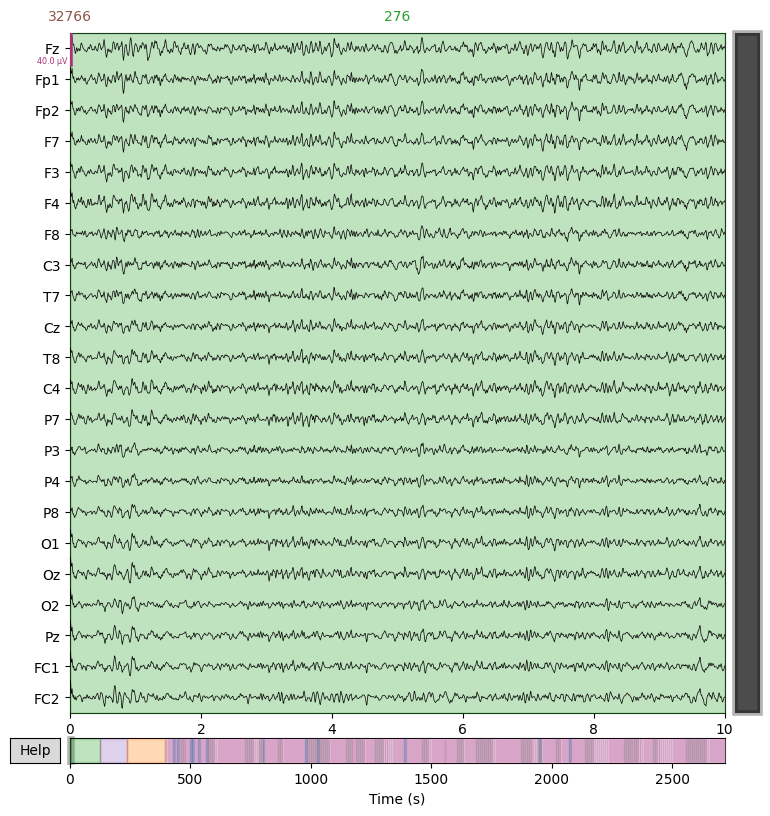

Writing /content/cleaned_data/second_session/A05E.fif


<ipython-input-22-996726315c80>:53: RuntimeWarning: This filename (/content/cleaned_data/second_session/A05E.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  cleaned_raw.save(new_file_path, overwrite=True)


Closing /content/cleaned_data/second_session/A05E.fif
[done]
data:A05E.gdf, label:A05E.mat
Extracting EDF parameters from /content/raw_data/A03E.gdf...
GDF file detected
Setting channel info structure...
Could not determine channel type of the following channels, they will be set as EEG:
EEG-Fz, EEG, EEG, EEG, EEG, EEG, EEG, EEG-C3, EEG, EEG-Cz, EEG, EEG-C4, EEG, EEG, EEG, EEG, EEG, EEG, EEG, EEG-Pz, EEG, EEG
Creating raw.info structure...
Reading 0 ... 648774  =      0.000 ...  2595.096 secs...


/usr/lib/python3.11/contextlib.py:144: RuntimeWarning: Channel names are not unique, found duplicates for: {'EEG'}. Applying running numbers for duplicates.
  next(self.gen)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 40 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.00
- Lower transition bandwidth: 2.00 Hz (-12 dB cutoff frequency: 3.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-12 dB cutoff frequency: 45.00 Hz)
- Filter length: 413 samples (1.652 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 48 - 52 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 48.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 48.25 Hz)

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.3s


Fitting ICA to data using 22 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.3s


Selecting by number: 22 components
Fitting ICA took 38.1s.
Applying ICA to Raw instance
    Transforming to ICA space (22 components)
    Zeroing out 2 ICA components
    Projecting back using 22 PCA components


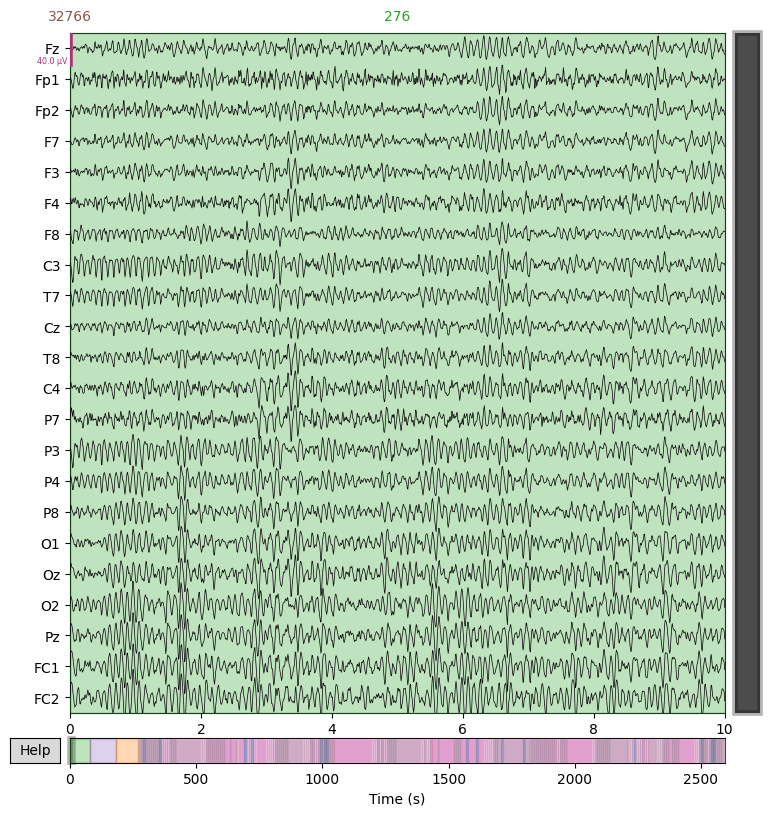

Writing /content/cleaned_data/second_session/A03E.fif


<ipython-input-22-996726315c80>:53: RuntimeWarning: This filename (/content/cleaned_data/second_session/A03E.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  cleaned_raw.save(new_file_path, overwrite=True)


Closing /content/cleaned_data/second_session/A03E.fif
[done]
data:A03E.gdf, label:A03E.mat
Extracting EDF parameters from /content/raw_data/A01E.gdf...
GDF file detected
Setting channel info structure...
Could not determine channel type of the following channels, they will be set as EEG:
EEG-Fz, EEG, EEG, EEG, EEG, EEG, EEG, EEG-C3, EEG, EEG-Cz, EEG, EEG-C4, EEG, EEG, EEG, EEG, EEG, EEG, EEG, EEG-Pz, EEG, EEG
Creating raw.info structure...
Reading 0 ... 686999  =      0.000 ...  2747.996 secs...


/usr/lib/python3.11/contextlib.py:144: RuntimeWarning: Channel names are not unique, found duplicates for: {'EEG'}. Applying running numbers for duplicates.
  next(self.gen)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 40 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.00
- Lower transition bandwidth: 2.00 Hz (-12 dB cutoff frequency: 3.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-12 dB cutoff frequency: 45.00 Hz)
- Filter length: 413 samples (1.652 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 48 - 52 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 48.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 48.25 Hz)

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.4s


Fitting ICA to data using 22 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.6s


Selecting by number: 22 components
Fitting ICA took 43.8s.
Applying ICA to Raw instance
    Transforming to ICA space (22 components)
    Zeroing out 2 ICA components
    Projecting back using 22 PCA components


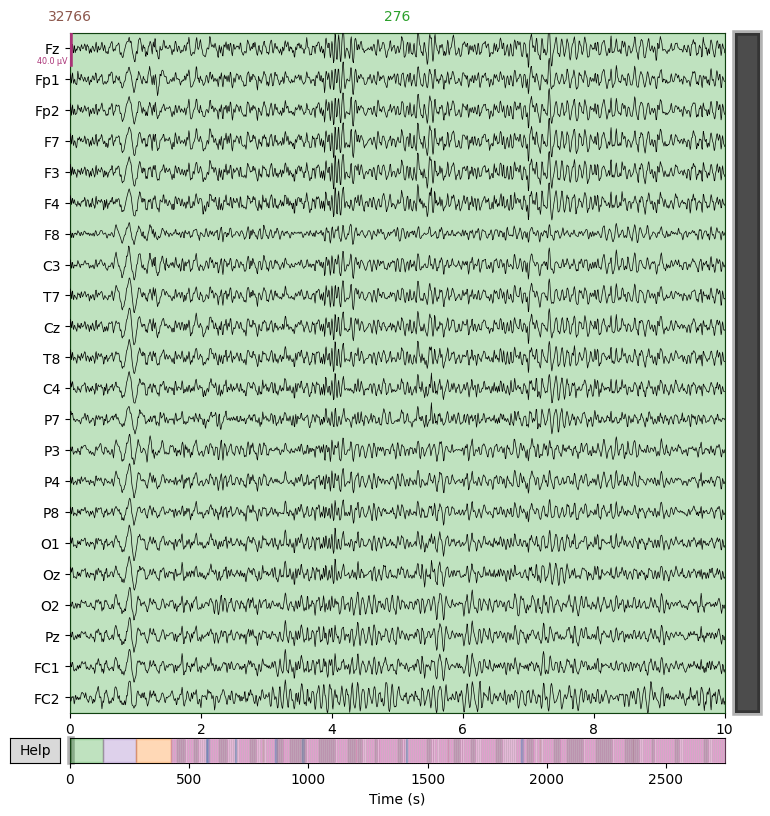

Writing /content/cleaned_data/second_session/A01E.fif


<ipython-input-22-996726315c80>:53: RuntimeWarning: This filename (/content/cleaned_data/second_session/A01E.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  cleaned_raw.save(new_file_path, overwrite=True)


Closing /content/cleaned_data/second_session/A01E.fif
[done]
data:A01E.gdf, label:A01E.mat
Extracting EDF parameters from /content/raw_data/A02E.gdf...
GDF file detected
Setting channel info structure...
Could not determine channel type of the following channels, they will be set as EEG:
EEG-Fz, EEG, EEG, EEG, EEG, EEG, EEG, EEG-C3, EEG, EEG-Cz, EEG, EEG-C4, EEG, EEG, EEG, EEG, EEG, EEG, EEG, EEG-Pz, EEG, EEG
Creating raw.info structure...
Reading 0 ... 662665  =      0.000 ...  2650.660 secs...


/usr/lib/python3.11/contextlib.py:144: RuntimeWarning: Channel names are not unique, found duplicates for: {'EEG'}. Applying running numbers for duplicates.
  next(self.gen)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 40 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.00
- Lower transition bandwidth: 2.00 Hz (-12 dB cutoff frequency: 3.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-12 dB cutoff frequency: 45.00 Hz)
- Filter length: 413 samples (1.652 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 48 - 52 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 48.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 48.25 Hz)

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.4s


Fitting ICA to data using 22 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.6s


Selecting by number: 22 components
Fitting ICA took 36.6s.
Applying ICA to Raw instance
    Transforming to ICA space (22 components)
    Zeroing out 2 ICA components
    Projecting back using 22 PCA components


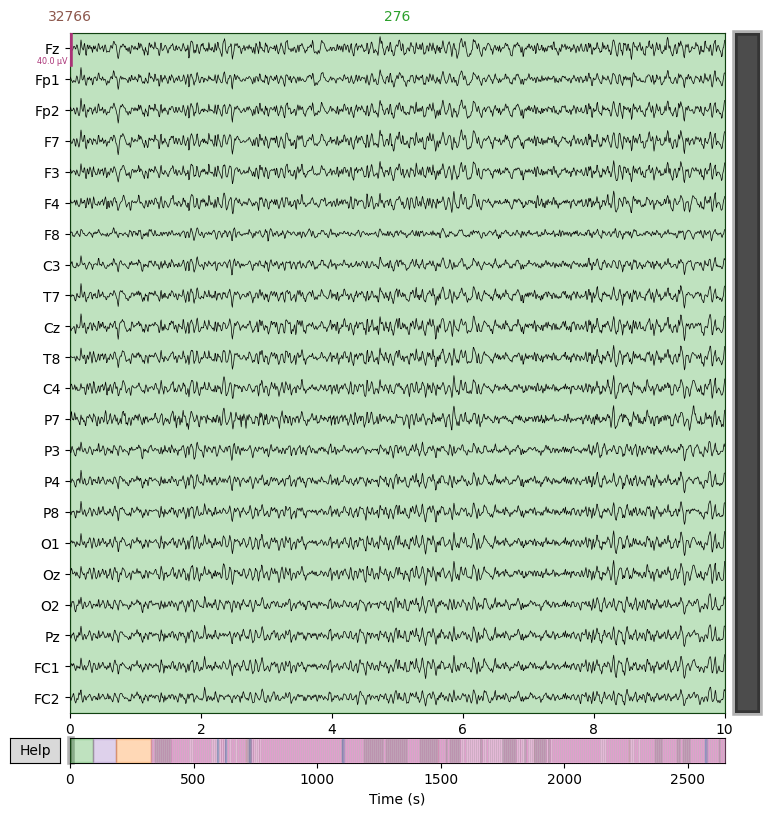

Writing /content/cleaned_data/second_session/A02E.fif


<ipython-input-22-996726315c80>:53: RuntimeWarning: This filename (/content/cleaned_data/second_session/A02E.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  cleaned_raw.save(new_file_path, overwrite=True)


Closing /content/cleaned_data/second_session/A02E.fif
[done]
data:A02E.gdf, label:A02E.mat
Extracting EDF parameters from /content/raw_data/A08E.gdf...
GDF file detected
Setting channel info structure...
Could not determine channel type of the following channels, they will be set as EEG:
EEG-Fz, EEG, EEG, EEG, EEG, EEG, EEG, EEG-C3, EEG, EEG-Cz, EEG, EEG-C4, EEG, EEG, EEG, EEG, EEG, EEG, EEG, EEG-Pz, EEG, EEG
Creating raw.info structure...
Reading 0 ... 687791  =      0.000 ...  2751.164 secs...


/usr/lib/python3.11/contextlib.py:144: RuntimeWarning: Channel names are not unique, found duplicates for: {'EEG'}. Applying running numbers for duplicates.
  next(self.gen)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 40 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.00
- Lower transition bandwidth: 2.00 Hz (-12 dB cutoff frequency: 3.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-12 dB cutoff frequency: 45.00 Hz)
- Filter length: 413 samples (1.652 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 48 - 52 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 48.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 48.25 Hz)

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


Fitting ICA to data using 22 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


Selecting by number: 22 components
Fitting ICA took 52.4s.
Applying ICA to Raw instance
    Transforming to ICA space (22 components)
    Zeroing out 2 ICA components
    Projecting back using 22 PCA components


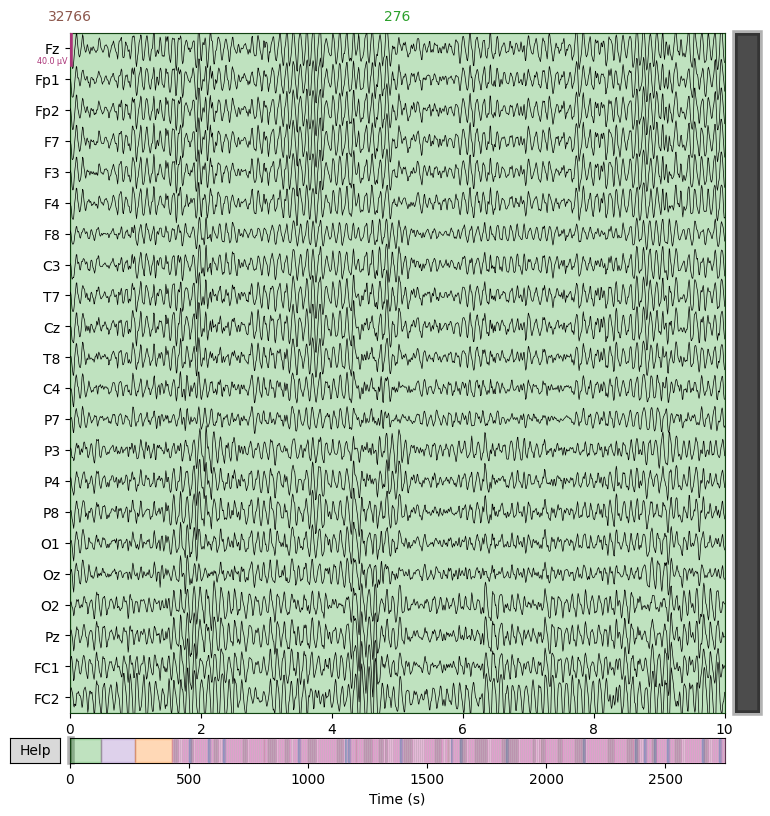

Writing /content/cleaned_data/second_session/A08E.fif


<ipython-input-22-996726315c80>:53: RuntimeWarning: This filename (/content/cleaned_data/second_session/A08E.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  cleaned_raw.save(new_file_path, overwrite=True)


Closing /content/cleaned_data/second_session/A08E.fif
[done]
data:A08E.gdf, label:A08E.mat
Extracting EDF parameters from /content/raw_data/A04E.gdf...
GDF file detected
Setting channel info structure...
Could not determine channel type of the following channels, they will be set as EEG:
EEG-Fz, EEG, EEG, EEG, EEG, EEG, EEG, EEG-C3, EEG, EEG-Cz, EEG, EEG-C4, EEG, EEG, EEG, EEG, EEG, EEG, EEG, EEG-Pz, EEG, EEG
Creating raw.info structure...
Reading 0 ... 660046  =      0.000 ...  2640.184 secs...


/usr/lib/python3.11/contextlib.py:144: RuntimeWarning: Channel names are not unique, found duplicates for: {'EEG'}. Applying running numbers for duplicates.
  next(self.gen)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 40 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.00
- Lower transition bandwidth: 2.00 Hz (-12 dB cutoff frequency: 3.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-12 dB cutoff frequency: 45.00 Hz)
- Filter length: 413 samples (1.652 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 48 - 52 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 48.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 48.25 Hz)

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.6s


Fitting ICA to data using 22 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


Selecting by number: 22 components
Fitting ICA took 30.8s.
Applying ICA to Raw instance
    Transforming to ICA space (22 components)
    Zeroing out 2 ICA components
    Projecting back using 22 PCA components


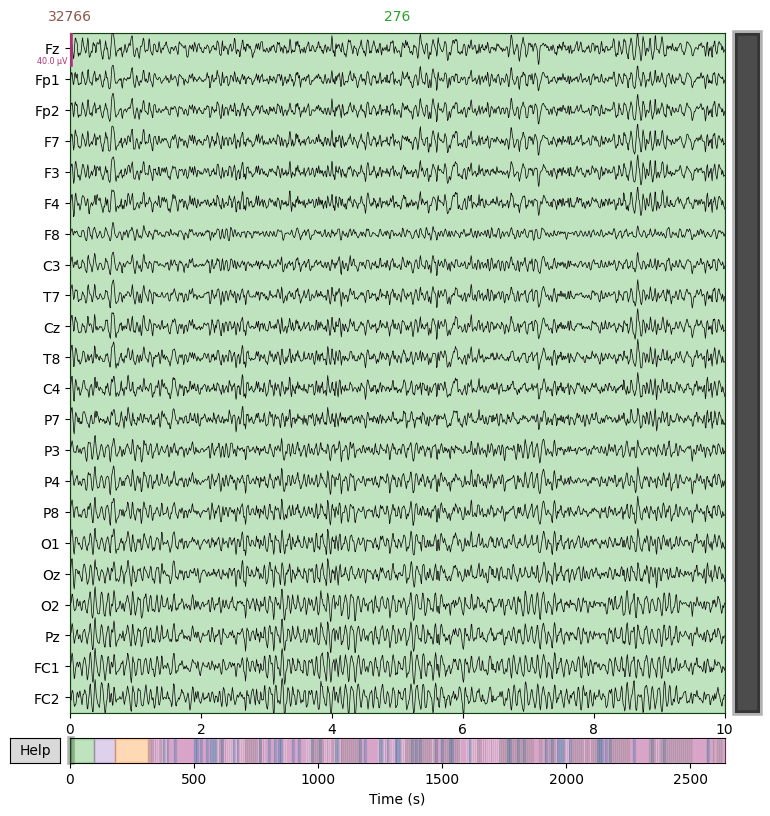

Writing /content/cleaned_data/second_session/A04E.fif


<ipython-input-22-996726315c80>:53: RuntimeWarning: This filename (/content/cleaned_data/second_session/A04E.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  cleaned_raw.save(new_file_path, overwrite=True)


Closing /content/cleaned_data/second_session/A04E.fif
[done]
data:A04E.gdf, label:A04E.mat
Extracting EDF parameters from /content/raw_data/A09E.gdf...
GDF file detected
Setting channel info structure...
Could not determine channel type of the following channels, they will be set as EEG:
EEG-Fz, EEG, EEG, EEG, EEG, EEG, EEG, EEG-C3, EEG, EEG-Cz, EEG, EEG-C4, EEG, EEG, EEG, EEG, EEG, EEG, EEG, EEG-Pz, EEG, EEG
Creating raw.info structure...
Reading 0 ... 675097  =      0.000 ...  2700.388 secs...


/usr/lib/python3.11/contextlib.py:144: RuntimeWarning: Channel names are not unique, found duplicates for: {'EEG'}. Applying running numbers for duplicates.
  next(self.gen)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 40 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.00
- Lower transition bandwidth: 2.00 Hz (-12 dB cutoff frequency: 3.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-12 dB cutoff frequency: 45.00 Hz)
- Filter length: 413 samples (1.652 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 48 - 52 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 48.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 48.25 Hz)

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.6s


Fitting ICA to data using 22 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


Selecting by number: 22 components
Fitting ICA took 36.9s.
Applying ICA to Raw instance
    Transforming to ICA space (22 components)
    Zeroing out 2 ICA components
    Projecting back using 22 PCA components


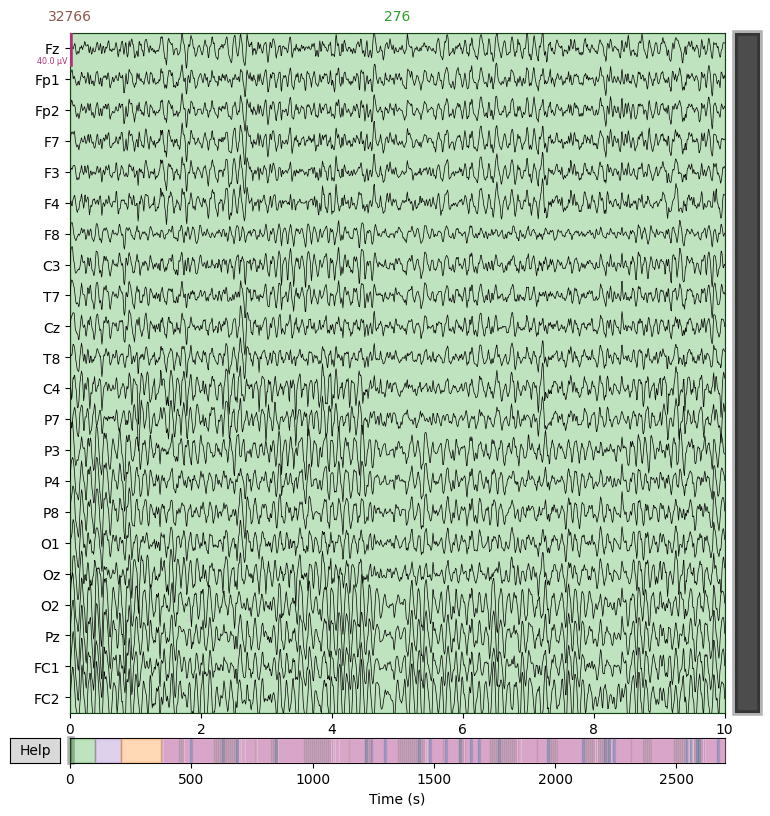

Writing /content/cleaned_data/second_session/A09E.fif


<ipython-input-22-996726315c80>:53: RuntimeWarning: This filename (/content/cleaned_data/second_session/A09E.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  cleaned_raw.save(new_file_path, overwrite=True)


Closing /content/cleaned_data/second_session/A09E.fif
[done]
data:A09E.gdf, label:A09E.mat
Extracting EDF parameters from /content/raw_data/A07E.gdf...
GDF file detected
Setting channel info structure...
Could not determine channel type of the following channels, they will be set as EEG:
EEG-Fz, EEG, EEG, EEG, EEG, EEG, EEG, EEG-C3, EEG, EEG-Cz, EEG, EEG-C4, EEG, EEG, EEG, EEG, EEG, EEG, EEG, EEG-Pz, EEG, EEG
Creating raw.info structure...
Reading 0 ... 673134  =      0.000 ...  2692.536 secs...


/usr/lib/python3.11/contextlib.py:144: RuntimeWarning: Channel names are not unique, found duplicates for: {'EEG'}. Applying running numbers for duplicates.
  next(self.gen)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 40 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.00
- Lower transition bandwidth: 2.00 Hz (-12 dB cutoff frequency: 3.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-12 dB cutoff frequency: 45.00 Hz)
- Filter length: 413 samples (1.652 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 48 - 52 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 48.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 48.25 Hz)

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


Fitting ICA to data using 22 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


Selecting by number: 22 components
Fitting ICA took 38.5s.
Applying ICA to Raw instance
    Transforming to ICA space (22 components)
    Zeroing out 2 ICA components
    Projecting back using 22 PCA components


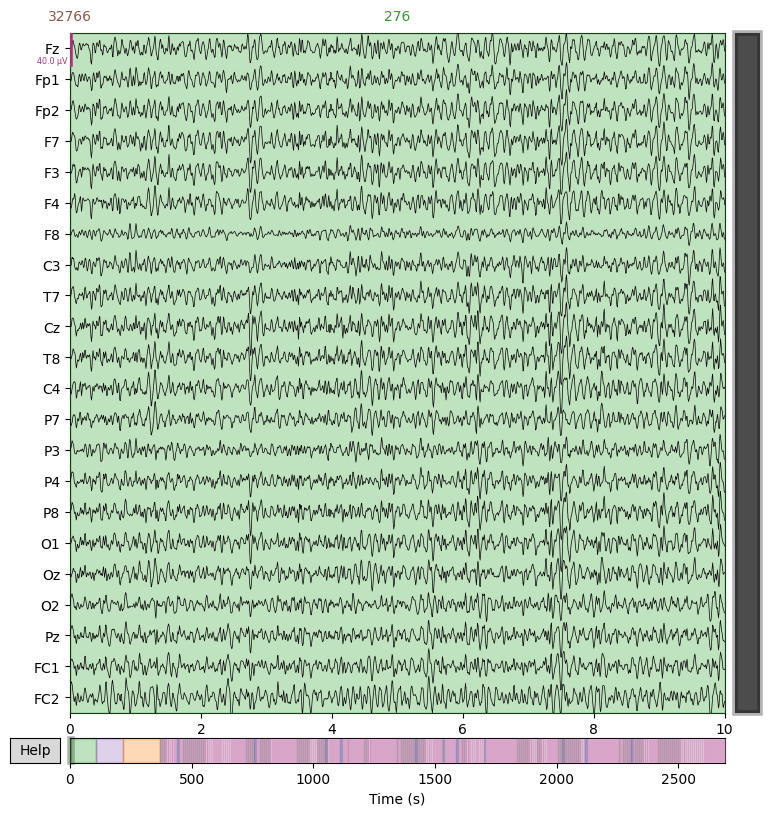

Writing /content/cleaned_data/second_session/A07E.fif


<ipython-input-22-996726315c80>:53: RuntimeWarning: This filename (/content/cleaned_data/second_session/A07E.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  cleaned_raw.save(new_file_path, overwrite=True)


Closing /content/cleaned_data/second_session/A07E.fif
[done]
data:A07E.gdf, label:A07E.mat
Extracting EDF parameters from /content/raw_data/A06E.gdf...
GDF file detected
Setting channel info structure...
Could not determine channel type of the following channels, they will be set as EEG:
EEG-Fz, EEG, EEG, EEG, EEG, EEG, EEG, EEG-C3, EEG, EEG-Cz, EEG, EEG-C4, EEG, EEG, EEG, EEG, EEG, EEG, EEG, EEG-Pz, EEG, EEG
Creating raw.info structure...
Reading 0 ... 666372  =      0.000 ...  2665.488 secs...


/usr/lib/python3.11/contextlib.py:144: RuntimeWarning: Channel names are not unique, found duplicates for: {'EEG'}. Applying running numbers for duplicates.
  next(self.gen)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 40 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.00
- Lower transition bandwidth: 2.00 Hz (-12 dB cutoff frequency: 3.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-12 dB cutoff frequency: 45.00 Hz)
- Filter length: 413 samples (1.652 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 48 - 52 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 48.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 48.25 Hz)

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


Fitting ICA to data using 22 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


Selecting by number: 22 components
Fitting ICA took 54.9s.
Applying ICA to Raw instance
    Transforming to ICA space (22 components)
    Zeroing out 2 ICA components
    Projecting back using 22 PCA components


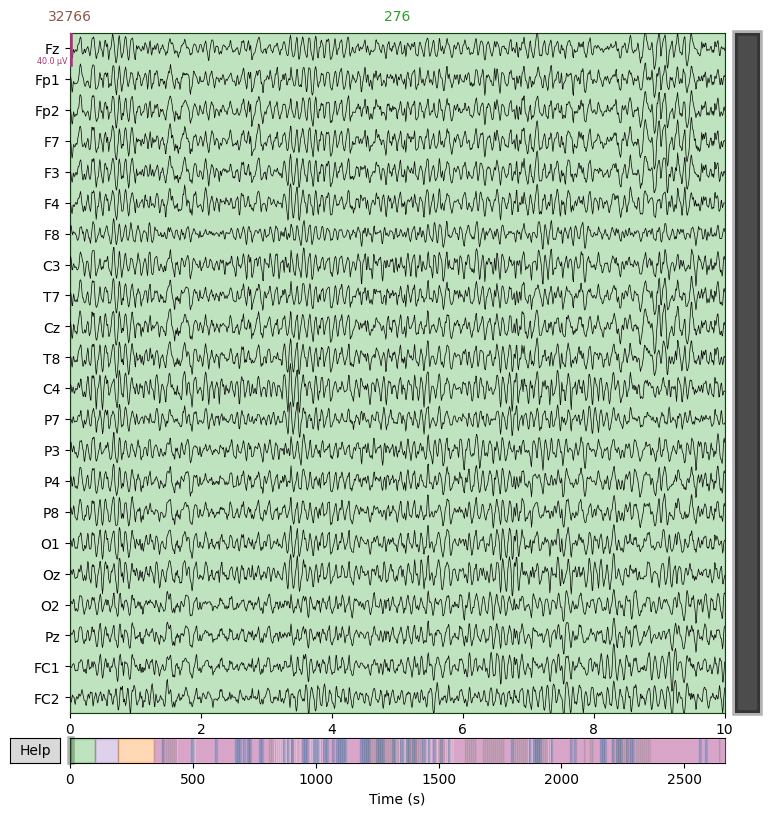

Writing /content/cleaned_data/second_session/A06E.fif


<ipython-input-22-996726315c80>:53: RuntimeWarning: This filename (/content/cleaned_data/second_session/A06E.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  cleaned_raw.save(new_file_path, overwrite=True)


Closing /content/cleaned_data/second_session/A06E.fif
[done]
data:A06E.gdf, label:A06E.mat


In [22]:
# Iterating through filtered files
for file in filtered_files:
    file_path = os.path.join(raw_data_folder, file)

    # Reading raw data
    eog_channels= ['EOG-left', 'EOG-central', 'EOG-right']  # Mark the EOG channels as bad

    raw = mne.io.read_raw_gdf(file_path, eog=eog_channels, preload=True)
    # Rename the channels based on rename_dict using MNE's rename_channels method
    raw.rename_channels(rename_dict)
    # Droping EOG channels
    raw.drop_channels(eog_channels)

    # Apply band-pass filter (mu and beta rhythms are important for motor imagery)
    raw.filter(l_freq=highpass, h_freq=lowpass, method='fir',
                  phase='zero-double', fir_window='hamming',
                  fir_design='firwin')

    # Apply notch filter for power line noise (50 or 60 Hz)
    raw.notch_filter(freqs=line_freq, notch_widths=2)

    # Create ICA object with number of components based on available channels
    n_components = min(22, raw.info['nchan'])  # Ensure n_components <= number of available EEG channels
    ica = ICA(n_components=n_components, random_state=97, method='fastica', max_iter=1000)
    ica.fit(raw)



    # Automatically find components that look like artifacts
    # For motor imagery, we want to preserve sensorimotor rhythms
    for idx, component in enumerate(ica.get_components()[:n_components]):
        # This is a simplified approach - in real applications, you might want to use
        # more sophisticated methods for artifact detection
        if idx < 2:  # Typically first components capture high-amplitude artifacts
            ica.exclude.append(idx)

    # Since EOG channels are already dropped, no need to call find_bads_eog
    # You can manually exclude any EOG-related components if you had prior knowledge

    # Apply ICA to the raw data to remove unwanted components (now no EOG channels)
    cleaned_raw = ica.apply(raw)


    # Set montage for standard EEG 10-20 system (only applies to EEG channels)
    # montage = mne.channels.make_standard_montage('standard_1020')
    # cleaned_raw.set_montage(montage)
    # cleaned_raw.plot_sensors(show_names=True)
    # cleaned_raw.plot(n_channels=len(cleaned_raw.info['ch_names']))
    raw.plot(n_channels=22)

    # Saving the modified raw data to a file with .fif suffix
    new_file_path = os.path.join(cleaned_data_folder, file[:-4] + '.fif')
    cleaned_raw.save(new_file_path, overwrite=True)
    # Appending data to t he list
    raw_list.append(cleaned_raw)

    # Mat files for the labels
    mat_file_name = file.replace('.gdf', '.mat')
    mat_file_path = os.path.join(mat_folder, mat_file_name)
    print(f"data:{file}, label:{mat_file_name}")

    if os.path.exists(mat_file_path):
        mat_data = scipy.io.loadmat(mat_file_path)
        class_labels = mat_data.get('classlabel', [])

        # Check if 'classlabel' key exists and is not empty
        if class_labels.size > 0:
            # Convert to a NumPy array and flatten
            class_labels_array = np.array(class_labels, dtype=int).flatten()
            # Append to second_session_labels
            second_session_labels.extend(class_labels_array)
        else:
            print(f"Warning: 'classlabel' not found or empty in {mat_file_name}.")
    else:
        print(f"Warning: {mat_file_name} not found.")

In [23]:
final_raw = mne.concatenate_raws(raw_list)
new_file_path = os.path.join(cleaned_data_folder, 'Second_Session_Subjects.fif')
final_raw.save(new_file_path, overwrite=True)

Writing /content/cleaned_data/second_session/Second_Session_Subjects.fif


<ipython-input-23-acef3a3f1026>:3: RuntimeWarning: This filename (/content/cleaned_data/second_session/Second_Session_Subjects.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  final_raw.save(new_file_path, overwrite=True)


Closing /content/cleaned_data/second_session/Second_Session_Subjects.fif
[done]


[PosixPath('/content/cleaned_data/second_session/Second_Session_Subjects.fif')]

## Second session events

In [24]:
events = mne.events_from_annotations(final_raw)
events[1]

Used Annotations descriptions: ['1023', '1072', '276', '277', '32766', '768', '783']


{'1023': 1, '1072': 2, '276': 3, '277': 4, '32766': 5, '768': 6, '783': 7}

In [25]:
epochs = mne.Epochs(final_raw, events[0], event_id=7, tmin=0, tmax=4, reject=None, baseline=None, preload=None)
second_session_data = epochs.get_data(copy=True)

Not setting metadata
2592 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 2592 events and 1001 original time points ...
0 bad epochs dropped


## Second session data shape

In [26]:
print("Second Session Dataset shape:",second_session_data.shape)

Second Session Dataset shape: (2592, 22, 1001)


# Feature Extraction with CSP

In [27]:
def extract_csp_features(X_data, y_labels, n_components=8):
    """
    Extract CSP features from EEG data

    Parameters:
    X_data (np.ndarray): EEG data with shape (n_trials, n_channels, n_times)
    y_labels (np.ndarray): Labels with shape (n_trials,)
    n_components (int): Number of CSP components to extract

    Returns:
    np.ndarray: CSP features with shape (n_trials, n_components, n_times)
    """
    # Initialize CSP
    csp = CSP(n_components=n_components, reg=None, log=True, norm_trace=False)

    # Fit CSP to the data
    csp.fit(X_data, y_labels)

    # Transform data
    X_csp = csp.transform(X_data)

    return X_csp

In [28]:
# Extract CSP features from both sessions
X_first_csp = extract_csp_features(first_session_data, first_session_labels)
X_second_csp = extract_csp_features(second_session_data, second_session_labels)


Computing rank from data with rank=None
    Using tolerance 0.00016 (2.2e-16 eps * 22 dim * 3.3e+10  max singular value)
    Estimated rank (data): 22
    data: rank 22 computed from 22 data channels with 0 projectors
Reducing data rank from 22 -> 22
Estimating class=7 covariance using EMPIRICAL
Done.
Estimating class=8 covariance using EMPIRICAL
Done.
Estimating class=9 covariance using EMPIRICAL
Done.
Estimating class=10 covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 0.00017 (2.2e-16 eps * 22 dim * 3.4e+10  max singular value)
    Estimated rank (data): 22
    data: rank 22 computed from 22 data channels with 0 projectors
Reducing data rank from 22 -> 22
Estimating class=1 covariance using EMPIRICAL
Done.
Estimating class=2 covariance using EMPIRICAL
Done.
Estimating class=3 covariance using EMPIRICAL
Done.
Estimating class=4 covariance using EMPIRICAL
Done.


# Extract Frequency Band Features

In [35]:
from mne.time_frequency import psd_array_welch

def extract_band_features(X_data, sfreq=250):
    """
    Extract frequency band features for motor imagery

    Parameters:
    X_data (np.ndarray): EEG data with shape (n_trials, n_channels, n_times)
    sfreq (float): Sampling frequency

    Returns:
    np.ndarray: Band power features
    """


    # Define frequency bands (motor imagery relevant)
    bands = {
        'mu': (8, 12),     # Mu rhythm (important for motor imagery)
        'beta_low': (13, 20),  # Low beta (important for motor imagery)
        'beta_high': (21, 30)  # High beta (important for motor imagery)
    }

    # Calculate PSD
    psds, freqs = psd_array_welch(X_data, sfreq=sfreq, fmin=4, fmax=40,
                           n_fft=256, n_overlap=128, n_per_seg=256)

    # Extract band powers
    features = []

    for band_name, (fmin, fmax) in bands.items():
        # Find frequencies in the specified range
        freq_idx = np.logical_and(freqs >= fmin, freqs <= fmax)

        # Calculate the mean band power
        band_power = np.mean(psds[:, :, freq_idx], axis=2)
        features.append(band_power)

    # Stack features
    return np.hstack(features)

X_first_band = extract_band_features(first_session_data)
X_second_band = extract_band_features(second_session_data)

Effective window size : 1.024 (s)
Effective window size : 1.024 (s)


## Feature Fusion

In [36]:
# Combining CSP and band features
X_first_features = np.hstack((X_first_csp, X_first_band))
X_second_features = np.hstack((X_second_csp, X_second_band))

In [37]:
# Combine first and second session data
X = np.vstack((X_first_features, X_second_features))
y = np.concatenate((first_session_labels, second_session_labels))

In [38]:
# Standard scaling of features
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Structuring the Date

In [40]:
# Split the data: 80% training, 20% testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
# Choosing Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Compute reshaped dimensions
feature_size = X.shape[1]
height = int(np.ceil(np.sqrt(feature_size)))
width = int(np.ceil(feature_size / height))

# Ensure dimensions match
assert height * width >= feature_size, "Reshaped dimensions are too small"

# Function to reshape and pad data
def reshape_features(X, height, width):
    X_reshaped = np.zeros((X.shape[0], 1, height, width))
    for i in range(X.shape[0]):
        reshaped_data = np.zeros((height, width))
        temp = X[i].reshape(-1)
        reshaped_data.flat[:temp.size] = temp
        X_reshaped[i, 0, :, :] = reshaped_data
    return X_reshaped

# Reshape training and testing data
X_train_reshaped = reshape_features(X_train, height, width)
X_test_reshaped = reshape_features(X_test, height, width)



In [41]:
# Convert to PyTorch Tensors
X_train_tensor = torch.Tensor(X_train_reshaped).to(device)
X_test_tensor = torch.Tensor(X_test_reshaped).to(device)
y_train_tensor = torch.LongTensor(y_train).to(device)
y_test_tensor = torch.LongTensor(y_test).to(device)

# Also create tensors for the original (non-reshaped) data for other model types
X_train_original_tensor = torch.Tensor(X_train).unsqueeze(1).to(device)
X_test_original_tensor = torch.Tensor(X_test).unsqueeze(1).to(device)

# Creating Tensor Datasets for both formats
train_dataset_2d = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset_2d = TensorDataset(X_test_tensor, y_test_tensor)

train_dataset_original = TensorDataset(X_train_original_tensor, y_train_tensor)
test_dataset_original = TensorDataset(X_test_original_tensor, y_test_tensor)

# Printing the sizes
print("Size of X_train (2D):", X_train_tensor.size())
print("Size of X_test (2D):", X_test_tensor.size())
print("Size of X_train (original):", X_train_original_tensor.size())
print("Size of X_test (original):", X_test_original_tensor.size())
print("Size of y_train:", y_train_tensor.size())
print("Size of y_test:", y_test_tensor.size())

Size of X_train (2D): torch.Size([4147, 1, 9, 9])
Size of X_test (2D): torch.Size([1037, 1, 9, 9])
Size of X_train (original): torch.Size([4147, 1, 74])
Size of X_test (original): torch.Size([1037, 1, 74])
Size of y_train: torch.Size([4147])
Size of y_test: torch.Size([1037])


# Save preprocessed data into drive

In [42]:
import os

# Mount Google Drive (only for Colab users)
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [43]:
# Define root save directory in Google Drive
root_save_path = "/content/drive/MyDrive/neuralnet_new_approach/preprocessed_data"

# Define separate paths for different data formats
numpy_save_path = os.path.join(root_save_path, "numpy_data")
torch_save_path = os.path.join(root_save_path, "torch_data")
csp_save_path = os.path.join(root_save_path, "csp_features")
raw_epochs_path = os.path.join(root_save_path, "raw_epochs")

# Create directories if they don't exist
os.makedirs(numpy_save_path, exist_ok=True)
os.makedirs(torch_save_path, exist_ok=True)
os.makedirs(csp_save_path, exist_ok=True)
os.makedirs(raw_epochs_path, exist_ok=True)

In [44]:
# Save original preprocessed data (from epochs)
np.save(os.path.join(raw_epochs_path, "first_session_data.npy"), first_session_data)
np.save(os.path.join(raw_epochs_path, "first_session_labels.npy"), first_session_labels)
np.save(os.path.join(raw_epochs_path, "second_session_data.npy"), second_session_data)
np.save(os.path.join(raw_epochs_path, "second_session_labels.npy"), second_session_labels)

# Save CSP features
np.save(os.path.join(csp_save_path, "X_first_csp.npy"), X_first_csp)
np.save(os.path.join(csp_save_path, "X_second_csp.npy"), X_second_csp)
np.save(os.path.join(csp_save_path, "X_first_band.npy"), X_first_band)
np.save(os.path.join(csp_save_path, "X_second_band.npy"), X_second_band)

# Save as NumPy files (processed data)
np.save(os.path.join(numpy_save_path, "X_train.npy"), X_train)
np.save(os.path.join(numpy_save_path, "X_test.npy"), X_test)
np.save(os.path.join(numpy_save_path, "y_train.npy"), y_train)
np.save(os.path.join(numpy_save_path, "y_test.npy"), y_test)
np.save(os.path.join(numpy_save_path, "X_train_reshaped.npy"), X_train_reshaped)
np.save(os.path.join(numpy_save_path, "X_test_reshaped.npy"), X_test_reshaped)

# Save as PyTorch tensors
torch.save(X_train_tensor, os.path.join(torch_save_path, "X_train_2d.pt"))
torch.save(X_test_tensor, os.path.join(torch_save_path, "X_test_2d.pt"))
torch.save(X_train_original_tensor, os.path.join(torch_save_path, "X_train_original.pt"))
torch.save(X_test_original_tensor, os.path.join(torch_save_path, "X_test_original.pt"))
torch.save(y_train_tensor, os.path.join(torch_save_path, "y_train.pt"))
torch.save(y_test_tensor, os.path.join(torch_save_path, "y_test.pt"))

print(f"✅ Data successfully saved in:\n"
      f"- {numpy_save_path} (NumPy format)\n"
      f"- {torch_save_path} (PyTorch format)\n"
      f"- {csp_save_path} (CSP features)\n"
      f"- {raw_epochs_path} (Raw preprocessed epochs)")

✅ Data successfully saved in:
- /content/drive/MyDrive/neuralnet_new_approach/preprocessed_data/numpy_data (NumPy format)
- /content/drive/MyDrive/neuralnet_new_approach/preprocessed_data/torch_data (PyTorch format)
- /content/drive/MyDrive/neuralnet_new_approach/preprocessed_data/csp_features (CSP features)
- /content/drive/MyDrive/neuralnet_new_approach/preprocessed_data/raw_epochs (Raw preprocessed epochs)
